# Traditional Autocorrelate

## Setup

In [1]:
import rasterio as rio
import numpy as np
import matplotlib.pyplot as plt

In [2]:
!mkdir autocorr_trad

In [16]:
a1 = rio.open("93deg result.tif").read()
a1 = np.moveaxis(a1, 0, -1)

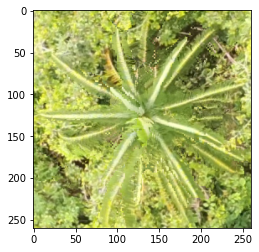

In [17]:
palm_93deg = a1[4420:4680,3670:3930]
plt.imshow(palm_93deg)

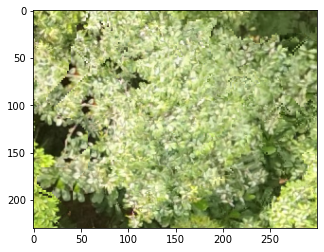

In [18]:
cam1_93deg = a1[4000:4230,4250:4550]
plt.imshow(cam1_93deg)

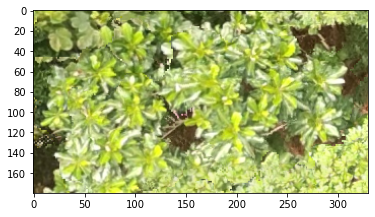

In [19]:
cam2_93deg = a1[4570:4750,4120:4450]
plt.imshow(cam2_93deg)

In [9]:
a2 = rio.open("183deg result.tif").read()
a2 = np.moveaxis(a2, 0, -1)

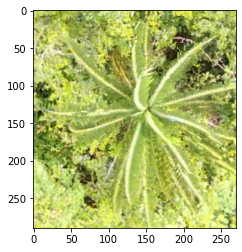

In [10]:
palm_183deg = a2[4230:4520,4100:4370]
plt.imshow(palm_183deg)

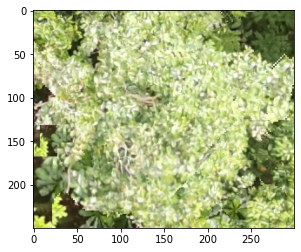

In [11]:
cam1_183deg = a2[3800:4050,4700:5000]
plt.imshow(cam1_183deg)

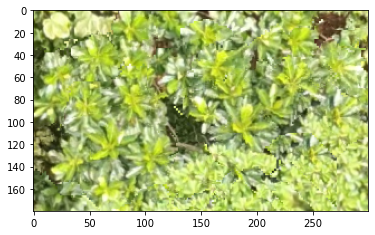

In [12]:
cam2_183deg = a2[4400:4580,4570:4870]
plt.imshow(cam2_183deg)

In [11]:
imgdicts = [
    { 'arr': '93deg', 'trees':
     [
         { 'name': 'palm', 'seg': palm_93deg, 'coords': (4420,4680,3670,3930) },
         { 'name': 'cam1', 'seg': cam1_93deg, 'coords': (4000,4230,4250,4550) },
         { 'name': 'cam2', 'seg': cam2_93deg, 'coords': (4570,4750,4120,4450) },
     ],
    },
    { 'arr': '183deg', 'trees':
     [
         { 'name': 'palm', 'seg': palm_183deg, 'coords': (4230,4520,4100,4370) },
         { 'name': 'cam1', 'seg': cam1_183deg, 'coords': (3800,4050,4700,5000) },
         { 'name': 'cam2', 'seg': cam2_183deg, 'coords': (4400,4580,4570,4870) },
     ],
    }
]

## Traditional selfdot autocorr

In [12]:
def acorr(np_arrlike):
    acorrs = {}
    acorrsarr = np.zeros((31,31,3), dtype='float32')
    arr = np_arrlike.astype('float32')
    arr -= np.median(arr, axis=(0,1), keepdims=True)
    for vstep in range(0,30+1):
        if vstep * 2 >= arr.shape[0] * 0.5:
            break
        for hstep in range(0,30+1):
            if hstep * 2 >= arr.shape[1] * 0.5:
                break
            for band in range(3):
                a = arr[:,:,band]
                if vstep == 0 and hstep == 0:
                    acorr = np.dot(a.flatten(), a.flatten())
                elif vstep == 0:
                    acorr = np.dot(a[:,hstep:].flatten(), a[:,:-hstep].flatten())
                elif hstep == 0:
                    acorr = np.dot(a[vstep:,:].flatten(), a[:-vstep,:].flatten())
                else:
                    acorr = np.dot(a[vstep:,hstep:].flatten(), a[:-vstep,:-hstep].flatten())
                olapsz = (a.shape[0] - vstep * 2) * (a.shape[1] - hstep * 2)
                acorrs[(vstep,hstep,band)] = {
                    'val': acorr,
                    'initsz': a.size,
                    'olapsz': olapsz,
                    'olappct': olapsz / a.size * 100
                }
                acorrsarr[vstep][hstep][band] = acorr
                #print('{} {}'.format((vstep,hstep,band), acorrs[(vstep,hstep,band)]))
    return (acorrs, acorrsarr)

In [13]:
from tqdm import tqdm
for imgdict in tqdm(imgdicts):
    for tree in tqdm(imgdict['trees']):
        tree['acorrs'], tree['acorrsarr'] = acorr(tree['seg'])

100%|██████████| 2/2 [00:00<00:00,  3.02it/s]


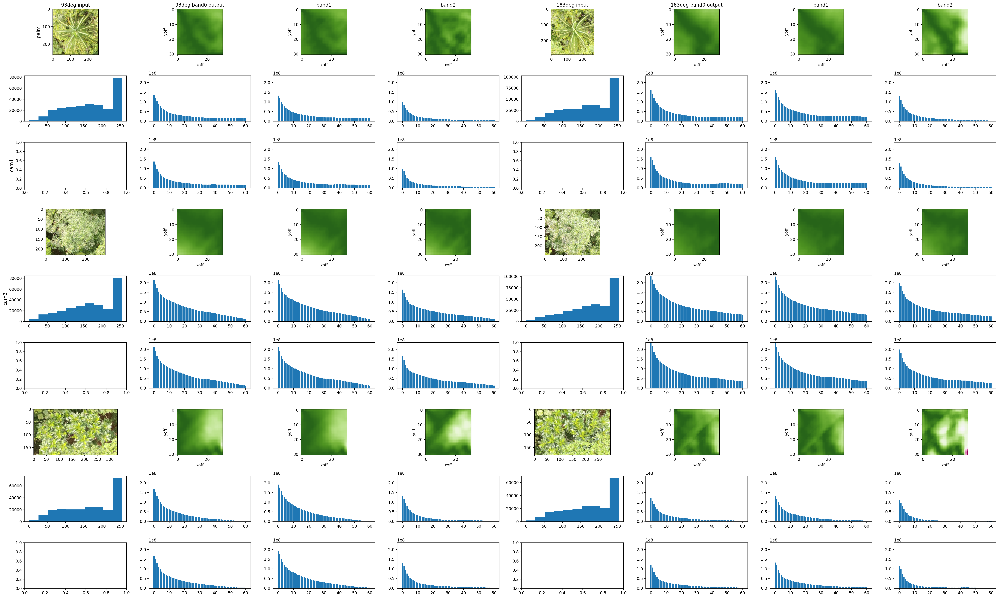

In [14]:
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from matplotlib.colors import LogNorm
from numpy.lib.stride_tricks import as_strided

nrows = len(imgdicts[0]['trees']) * 3
ncols = 8
f, axes  = plt.subplots(nrows, ncols,
                        figsize=(35,21), dpi=80*2.5)

maxval = max([t['acorrsarr'].max() for idict in imgdicts for t in idict['trees']])
minval = min([t['acorrsarr'].min() for idict in imgdicts for t in idict['trees']])
i_maxval = max([t['seg'].max() for idict in imgdicts for t in idict['trees']])
i_minval = min([t['seg'].min() for idict in imgdicts for t in idict['trees']])

col = 0
for imgdict in imgdicts:
    row = 0
    for tree in imgdict['trees']:
        seg = tree['seg']
        axes[row][col].imshow(seg)
        axes[row+1][col].hist(seg.flatten(), range=(i_minval, i_maxval))
        #axes[row+1][col].set_ylim(i_minval, i_maxval)

        acorrsarr = tree['acorrsarr']
        for band in range(3):
            Z = acorrsarr[:,:,band]

            diagsavg = [np.average(i) for i in 
                        [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagsavg = np.array(diagsavg)

            diagscavg = [(i[0] + np.median(i) + i[-1]) / 3 for i in 
                         [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagscavg = np.array(diagscavg)
            
            diagsabsmax = [np.max(np.abs(i)) for i in 
                           [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagsabsmax = np.array(diagsabsmax)
            diagsabsmax_2d = as_strided(diagsabsmax, Z.shape,
                                        (diagsabsmax.strides[0], diagsabsmax.strides[0]))
            Z_normed = Z/diagsabsmax_2d

            #arr = Z_normed
            #for a in arr:
            #    for elem in a:
            #        print("{:.1f} ".format(elem).rjust(3), end="")
            #    print(end="\n")
            #print(end="\n")

            axes[row][col+1+band].imshow(Z_normed,
                                         vmin=-1,
                                         vmax=1,
                                         cmap='PiYG', interpolation='nearest')
            axes[row][col+1+band].set_ylabel("yoff")
            axes[row][col+1+band].set_xlabel("xoff")
            axes[row+1][col+1+band].bar(range(0, diagsavg.size), diagsavg)
            axes[row+1][col+1+band].set_ylim([minval,maxval])
            axes[row+2][col+1+band].bar(range(0, diagscavg.size), diagscavg)
            axes[row+2][col+1+band].set_ylim([minval,maxval])

            #X, Y = np.mgrid[0:Z.shape[0], 0:Z.shape[1]]
            #surf = axes[row][col+1]\
            #    .plot_surface(X, Y, Z, cmap=cm.coolwarm,
            #                  rstride=1, cstride=1,
            #                  linewidth=0, antialiased=False)
            #axes[row][col+1+band].set_zlim(minval, maxval)
            #axes[row][col+1+band].zaxis.set_major_locator(LinearLocator(10))
        row += 3
    col += 4
#f.colorbar(surf, shrink=0.5, aspect=5)

rownames = ["93deg input", "93deg band0 output", "band1", "band2",
            "183deg input", "183deg band0 output", "band1", "band2"]
colnames = ["palm", "", "cam1", "", "cam2", ""]
for ax, col in zip(axes[0], rownames):
    ax.set_title(col)
for ax, row in zip(axes[:,0], colnames):
    ax.set_ylabel(row, size='large')

plt.tight_layout()
plt.show()
f.savefig("autocorr_trad/autocorr_dot.png", dpi=f.dpi)

## Traditional Pearson's autocorr

In [15]:
def acorr(np_arrlike):
    acorrs = {}
    acorrsarr = np.empty((31,31,3), dtype='float32')
    acorrsarr.fill(0)
    arr = np_arrlike.astype('float32')
    arr -= np.median(arr, axis=(0,1), keepdims=True)
    for vstep in range(0,30+1):
        if vstep * 2 >= arr.shape[0] * 0.5:
            break
        for hstep in range(0,30+1):
            if hstep * 2 >= arr.shape[1] * 0.5:
                break
            for band in range(3):
                a = arr[:,:,band]
                if vstep == 0 and hstep == 0:
                    acorr = np.corrcoef(a.flatten(), a.flatten())
                elif vstep == 0:
                    acorr = np.corrcoef(a[:,hstep:].flatten(), a[:,:-hstep].flatten())
                elif hstep == 0:
                    acorr = np.corrcoef(a[vstep:,:].flatten(), a[:-vstep,:].flatten())
                else:
                    acorr = np.corrcoef(a[vstep:,hstep:].flatten(), a[:-vstep,:-hstep].flatten())
                acorr = acorr[1,0]
                olapsz = (a.shape[0] - vstep * 2) * (a.shape[1] - hstep * 2)
                acorrs[(vstep,hstep,band)] = {
                    'val': acorr,
                    'initsz': a.size,
                    'olapsz': olapsz,
                    'olappct': olapsz / a.size * 100
                }
                acorrsarr[vstep][hstep][band] = acorr
                #print('{} {}'.format((vstep,hstep,band), acorrs[(vstep,hstep,band)]))
    return (acorrs, acorrsarr)

In [16]:
from tqdm import tqdm
for imgdict in tqdm(imgdicts):
    for tree in tqdm(imgdict['trees']):
        tree['acorrs'], tree['acorrsarr'] = acorr(tree['seg'])

100%|██████████| 2/2 [00:08<00:00,  4.43s/it]


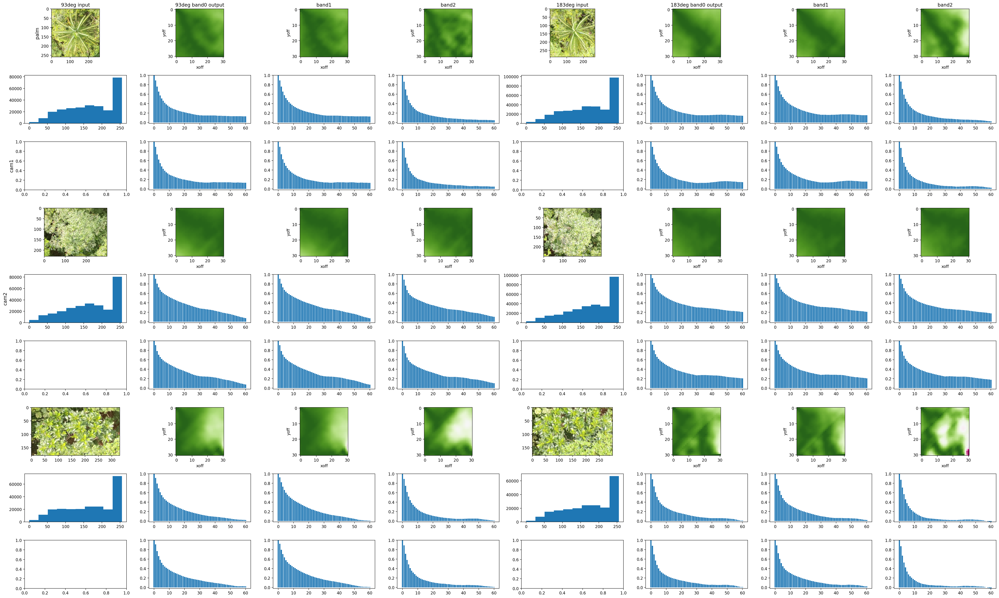

In [17]:
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from matplotlib.colors import LogNorm
from numpy.lib.stride_tricks import as_strided

nrows = len(imgdicts[0]['trees']) * 3
ncols = 8
f, axes  = plt.subplots(nrows, ncols,
                        figsize=(35,21), dpi=80*2.5)

maxval = max([t['acorrsarr'].max() for idict in imgdicts for t in idict['trees']])
minval = min([t['acorrsarr'].min() for idict in imgdicts for t in idict['trees']])
i_maxval = max([t['seg'].max() for idict in imgdicts for t in idict['trees']])
i_minval = min([t['seg'].min() for idict in imgdicts for t in idict['trees']])

col = 0
for imgdict in imgdicts:
    row = 0
    for tree in imgdict['trees']:
        seg = tree['seg']
        axes[row][col].imshow(seg)
        axes[row+1][col].hist(seg.flatten(), range=(i_minval, i_maxval))
        #axes[row+1][col].set_ylim(i_minval, i_maxval)

        acorrsarr = tree['acorrsarr']
        for band in range(3):
            Z = acorrsarr[:,:,band]

            diagsavg = [np.average(i) for i in 
                        [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagsavg = np.array(diagsavg)
            
            diagscavg = [(i[0] + np.median(i) + i[-1]) / 3 for i in 
                         [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagscavg = np.array(diagscavg)
            
            diagsabsmax = [np.max(np.abs(i)) for i in 
                           [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagsabsmax = np.array(diagsabsmax)
            diagsabsmax_2d = as_strided(diagsabsmax, Z.shape,
                                        (diagsabsmax.strides[0], diagsabsmax.strides[0]))
            Z_normed = Z/diagsabsmax_2d

            #arr = Z_normed
            #for a in arr:
            #    for elem in a:
            #        print("{:.1f} ".format(elem).rjust(3), end="")
            #    print(end="\n")
            #print(end="\n")

            axes[row][col+1+band].imshow(Z_normed,
                                         vmin=-1,
                                         vmax=1,
                                         cmap='PiYG', interpolation='nearest')
            axes[row][col+1+band].set_ylabel("yoff")
            axes[row][col+1+band].set_xlabel("xoff")
            axes[row+1][col+1+band].bar(range(0, diagsavg.size), diagsavg)
            axes[row+1][col+1+band].set_ylim([minval,maxval])
            axes[row+2][col+1+band].bar(range(0, diagscavg.size), diagscavg)
            axes[row+2][col+1+band].set_ylim([minval,maxval])
            #X, Y = np.mgrid[0:Z.shape[0], 0:Z.shape[1]]
            #surf = axes[row][col+1]\
            #    .plot_surface(X, Y, Z, cmap=cm.coolwarm,
            #                  rstride=1, cstride=1,
            #                  linewidth=0, antialiased=False)
            #axes[row][col+1+band].set_zlim(minval, maxval)
            #axes[row][col+1+band].zaxis.set_major_locator(LinearLocator(10))
        row += 3
    col += 4
#f.colorbar(surf, shrink=0.5, aspect=5)

rownames = ["93deg input", "93deg band0 output", "band1", "band2",
            "183deg input", "183deg band0 output", "band1", "band2"]
colnames = ["palm", "", "cam1", "", "cam2", ""]
for ax, col in zip(axes[0], rownames):
    ax.set_title(col)
for ax, row in zip(axes[:,0], colnames):
    ax.set_ylabel(row, size='large')

plt.tight_layout()
plt.show()
f.savefig("autocorr_trad/autocorr_psons.png", dpi=f.dpi)

## Cropping acorr

In [18]:
def acorr(np_arrlike):
    c_by = 30
    acorrs = {}
    acorrsarr = np.zeros((31,31,3), dtype='float32')
    np_arrlike = np_arrlike[c_by:-c_by,c_by:-c_by,:]
    arr = np_arrlike.astype('float32')
    arr -= np.median(arr, axis=(0,1), keepdims=True)
    for vstep in range(0,30+1):
        if vstep * 2 >= arr.shape[0] * 0.6:
            break
        for hstep in range(0,30+1):
            if hstep * 2 >= arr.shape[1] * 0.6:
                break
            for band in range(3):
                a = arr[:,:,band]
                if vstep == 0 and hstep == 0:
                    acorr = np.dot(a.flatten(), a.flatten())
                elif vstep == 0:
                    acorr = np.dot(a[:,hstep:].flatten(), a[:,:-hstep].flatten())
                elif hstep == 0:
                    acorr = np.dot(a[vstep:,:].flatten(), a[:-vstep,:].flatten())
                else:
                    acorr = np.dot(a[vstep:,hstep:].flatten(), a[:-vstep,:-hstep].flatten())
                olapsz = (a.shape[0] - vstep * 2) * (a.shape[1] - hstep * 2)
                acorrs[(vstep,hstep,band)] = {
                    'val': acorr,
                    'initsz': a.size,
                    'olapsz': olapsz,
                    'olappct': olapsz / a.size * 100
                }
                acorrsarr[vstep][hstep][band] = acorr
                #print('{} {}'.format((vstep,hstep,band), acorrs[(vstep,hstep,band)]))
    return (acorrs, acorrsarr, np_arrlike)

from tqdm import tqdm
for imgdict in tqdm(imgdicts):
    for tree in tqdm(imgdict['trees']):
        tree['acorrs'], tree['acorrsarr'], tree['seg_cropped'] = acorr(tree['seg'])

100%|██████████| 2/2 [00:00<00:00,  2.68it/s]


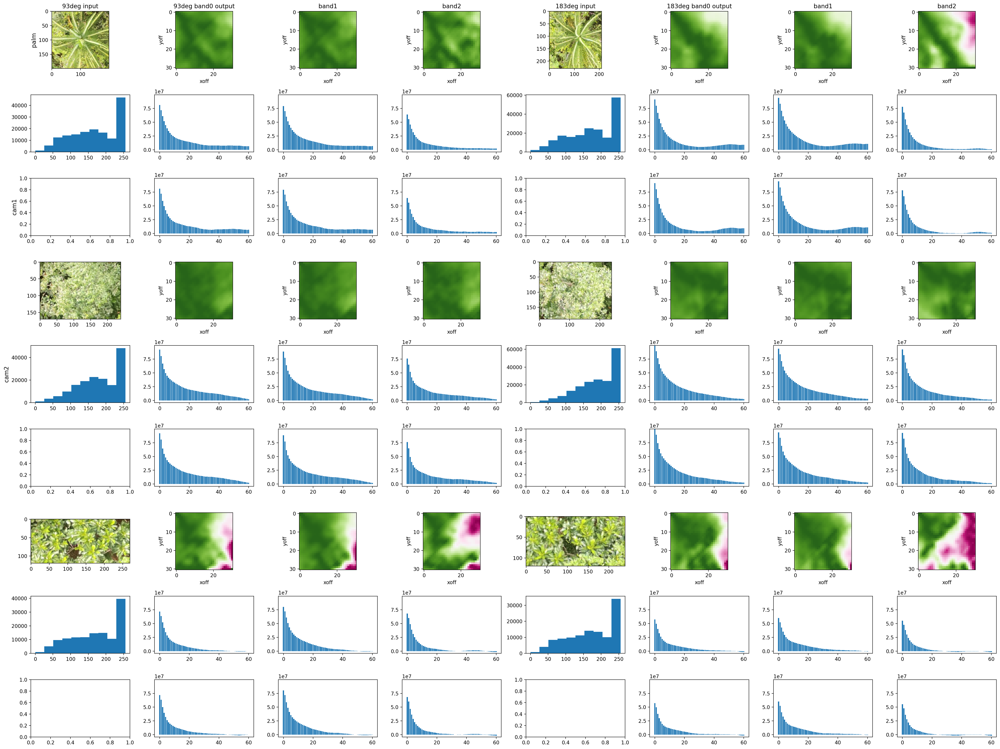

In [19]:
from matplotlib import cm
from matplotlib.ticker import LinearLocator
from matplotlib.colors import LogNorm
from numpy.lib.stride_tricks import as_strided

nrows = len(imgdicts[0]['trees']) * 3
ncols = 8
f, axes  = plt.subplots(nrows, ncols,
                        figsize=(28,21), dpi=80*2.5)

maxval = max([t['acorrsarr'].max() for idict in imgdicts for t in idict['trees']])
minval = min([t['acorrsarr'].min() for idict in imgdicts for t in idict['trees']])
i_maxval = max([t['seg'].max() for idict in imgdicts for t in idict['trees']])
i_minval = min([t['seg'].min() for idict in imgdicts for t in idict['trees']])

col = 0
for imgdict in imgdicts:
    row = 0
    for tree in imgdict['trees']:
        seg = tree['seg_cropped']
        axes[row][col].imshow(seg)
        axes[row+1][col].hist(seg.flatten(), range=(i_minval, i_maxval))
        #axes[row+1][col].set_ylim(i_minval, i_maxval)
        
        acorrsarr = tree['acorrsarr']
        for band in range(3):
            Z = acorrsarr[:,:,band]

            diagsavg = [np.average(i) for i in 
                        [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagsavg = np.array(diagsavg)
            
            diagscavg = [(i[0] + np.median(i) + i[-1]) / 3 for i in 
                         [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagscavg = np.array(diagscavg)
            
            diagsabsmax = [np.max(np.abs(i)) for i in 
                           [Z[::-1,:].diagonal(i) for i in range(-Z.shape[0]+1,Z.shape[1])]]
            diagsabsmax = np.array(diagsabsmax)
            diagsabsmax_2d = as_strided(diagsabsmax, Z.shape,
                                        (diagsabsmax.strides[0], diagsabsmax.strides[0]))
            Z_normed = Z/diagsabsmax_2d
                        
            #arr = Z_normed
            #for a in arr:
            #    for elem in a:
            #        print("{:.1f} ".format(elem).rjust(3), end="")
            #    print(end="\n")
            #print(end="\n")

            axes[row][col+1+band].imshow(Z_normed,
                                         vmin=-1, vmax=1,
                                         cmap='PiYG', interpolation='nearest')
            axes[row][col+1+band].set_ylabel("yoff")
            axes[row][col+1+band].set_xlabel("xoff")
            axes[row+1][col+1+band].bar(range(0, diagsavg.size), diagsavg)
            axes[row+1][col+1+band].set_ylim([minval,maxval])
            axes[row+2][col+1+band].bar(range(0, diagscavg.size), diagscavg)
            axes[row+2][col+1+band].set_ylim([minval,maxval])
            #X, Y = np.mgrid[0:Z.shape[0], 0:Z.shape[1]]
            #surf = axes[row][col+1]\
            #    .plot_surface(X, Y, Z, cmap=cm.coolwarm,
            #                  rstride=1, cstride=1,
            #                  linewidth=0, antialiased=False)
            #axes[row][col+1+band].set_zlim(minval, maxval)
            #axes[row][col+1+band].zaxis.set_major_locator(LinearLocator(10))
        row += 3
    col += 4
#f.colorbar(surf, shrink=0.5, aspect=5)

rownames = ["93deg input", "93deg band0 output", "band1", "band2",
            "183deg input", "183deg band0 output", "band1", "band2"]
colnames = ["palm", "", "cam1", "", "cam2", ""]
for ax, col in zip(axes[0], rownames):
    ax.set_title(col)
for ax, row in zip(axes[:,0], colnames):
    ax.set_ylabel(row, size='large')
    
plt.tight_layout()
plt.show()
f.savefig("autocorr_trad/autocorr_dot_cropped.png", dpi=f.dpi)

In [20]:
Z_normed

array([[ 1.00000000e+00,  9.97388601e-01,  8.35185051e-01,
         7.77385890e-01,  6.99862719e-01,  6.78211927e-01,
         6.49618208e-01,  6.54917002e-01,  6.73276365e-01,
         7.10158229e-01,  7.32122660e-01,  7.48124778e-01,
         7.36425877e-01,  7.04489946e-01,  6.57940447e-01,
         6.13709390e-01,  6.06243849e-01,  6.24668300e-01,
         6.91403151e-01,  6.74112141e-01,  5.96185505e-01,
         4.93604869e-01,  2.41558254e-01, -2.01418102e-01,
        -6.89287603e-01, -1.00000000e+00, -1.00000000e+00,
        -1.00000000e+00, -1.00000000e+00, -8.56274843e-01,
        -6.12902045e-01],
       [ 1.00000000e+00,  1.00000000e+00,  9.88735735e-01,
         8.97221804e-01,  8.60535920e-01,  8.03141952e-01,
         7.73802817e-01,  7.56085455e-01,  7.78574646e-01,
         8.01339746e-01,  8.11639309e-01,  7.98599899e-01,
         7.80372322e-01,  7.38528073e-01,  6.66533470e-01,
         6.42648399e-01,  6.42622232e-01,  6.90925002e-01,
         7.35077739e-01,  7.25